In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import random
from imgaug import BoundingBox, BoundingBoxesOnImage, augmenters as iaa
import cv2
import matplotlib.pyplot as plt
import albumentations as A
import shutil
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
from xml.etree import ElementTree as ET
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
from torch.utils.data.dataloader import default_collate
from torch.nn.utils.rnn import pad_sequence
from torchvision.models.detection import fasterrcnn_resnet50_fpn

### Defining paths of our original dataset files

In [2]:
train_images_path = "FasterRCNN-dataset/train/images"
train_labels_path = "FasterRCNN-dataset/train/labels"

val_images_path = "FasterRCNN-dataset/val/images"
val_images_labels = "FasterRCNN-dataset/val/labels"

test_images_path = "FasterRCNN-dataset/test/images"
test_images_labels = "FasterRCNN-dataset/test/labels"

####  Defining augmentation transformations

In [3]:
augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomCrop(height=300, width=300, p=0.5),  # Randomly crop image
    A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, always_apply=False, p=0.5),
    A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=0.5),  # Randomly shift colors
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),  # Add gaussian noise
])

### Doing augmentation on training dataset

In [4]:
import albumentations as A

# Path to the directory containing original images
original_images_dir = 'FasterRCNN-dataset/train/images/'

# Path to the directory where augmented images will be stored
augmented_images_dir = 'TRAIN-FasterRCNN-augmented-dataset/train/images/'

# Ensure the augmented images directory exists, if not, create it
os.makedirs(augmented_images_dir, exist_ok=True)

# List all files in the original images directory
image_files = os.listdir(original_images_dir)

# Iterate through each image file
for image_file in image_files:
    # Load the original image
    image_path = os.path.join(original_images_dir, image_file)
    original_image = cv2.imread(image_path)

    # Apply augmentation
    augmented_image = augmentation(image=original_image)['image']

    # Construct augmented image filename
    augmented_image_filename = os.path.splitext(image_file)[0] + '_aug' + os.path.splitext(image_file)[1]

    # Save augmented image
    augmented_image_path = os.path.join(augmented_images_dir, augmented_image_filename)
    cv2.imwrite(augmented_image_path, augmented_image)

### Displaying few random images from train(augmented), val and test sets

In [5]:
def plot_random_images(image_dir, num_images=5, set_type='Train'):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(f"Random Images from {set_type} Set", fontsize=16)

    for i in range(num_images):
        random_image = random.choice(os.listdir(image_dir))
        image_path = os.path.join(image_dir, random_image)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.subplots_adjust(top= 1.2)
    plt.show()

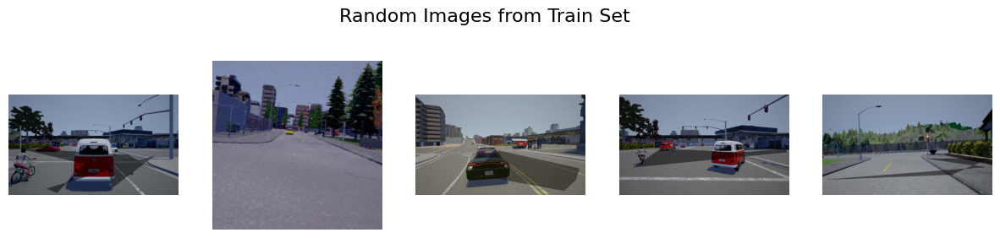

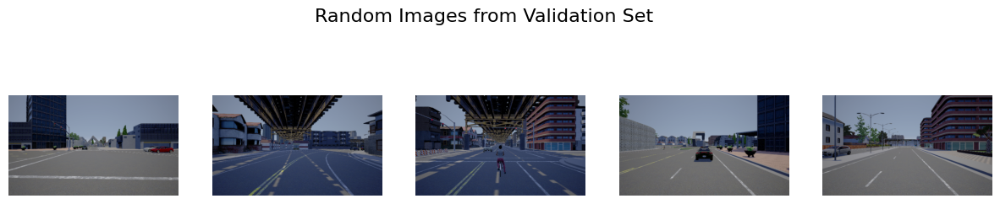

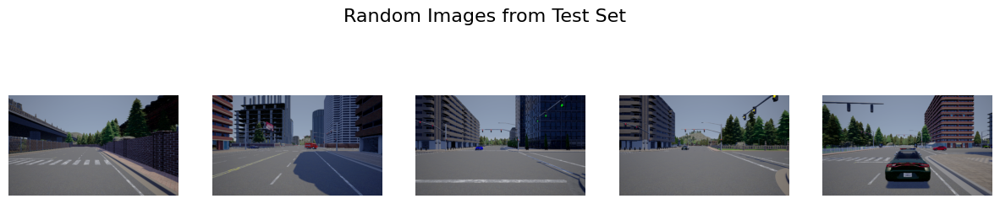

In [6]:
#plotting random images from augmented train set
plot_random_images(augmented_images_dir, set_type='Train')

#plotting random images from validation set
plot_random_images(val_images_path, set_type='Validation')

#plotting random images from test set
plot_random_images(test_images_path, set_type='Test')

### Parsing train labels

In [7]:
#parsing function definition
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    boxes = []
    for obj in root.findall('object'):
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)
        label = obj.find('name').text
        boxes.append((xmin, ymin, xmax, ymax, label))

    return boxes

def read_labels(labels_path):
    labels_data = {}
    for filename in os.listdir(labels_path):
        if filename.endswith('.xml'):
            image_id = os.path.splitext(filename)[0]
            xml_file = os.path.join(labels_path, filename)
            labels_data[image_id] = parse_xml(xml_file)
    return labels_data

In [8]:
# Define paths
train_labels_path = 'FasterRCNN-dataset/train/labels'

# Parse train and validation labels
train_labels = read_labels(train_labels_path)

# Example usage
print("Train Labels:")
print(train_labels)


Train Labels:
{'Town01_001020': [], 'Town01_001080': [], 'Town01_001140': [], 'Town01_001200': [], 'Town01_001260': [], 'Town01_001320': [], 'Town01_001380': [], 'Town01_001440': [(384, 176, 402, 194, 'traffic_sign')], 'Town01_001500': [(386, 176, 405, 194, 'traffic_sign')], 'Town01_001560': [], 'Town01_001620': [(362, 162, 367, 186, 'traffic_light')], 'Town01_001680': [(43, 201, 158, 304, 'motobike')], 'Town01_001740': [(241, 181, 287, 218, 'vehicle'), (314, 193, 324, 201, 'vehicle')], 'Town01_001800': [(310, 191, 330, 210, 'vehicle')], 'Town01_001860': [(201, 205, 439, 380, 'vehicle'), (363, 159, 369, 184, 'traffic_light')], 'Town01_001920': [(308, 193, 339, 219, 'vehicle'), (227, 190, 269, 221, 'vehicle'), (266, 190, 288, 210, 'vehicle')], 'Town01_001980': [(303, 192, 335, 220, 'vehicle'), (1, 182, 50, 337, 'vehicle'), (284, 186, 305, 203, 'vehicle')], 'Town01_002040': [(198, 201, 443, 379, 'vehicle'), (202, 180, 268, 212, 'vehicle'), (376, 145, 386, 183, 'traffic_light'), (271, 185

### Using FasterRNN as our model and preparing the modl for training it from scratch

In [9]:
class CustomDataset(Dataset):
    def __init__(self, images_dir, labels_data, class_map, max_objects_per_image, transforms=None):
        self.images_dir = images_dir
        self.labels_data = labels_data
        self.image_ids = list(labels_data.keys())
        self.class_map = class_map  # Mapping from class names to numerical IDs
        self.max_objects_per_image = max_objects_per_image  # Maximum number of objects per image
        self.transforms = transforms

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_path = os.path.join(self.images_dir, image_id + '.png')

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        labels = self.labels_data[image_id]

        # Convert class labels from string to numerical IDs using the class_map
        label_ids = [self.class_map[label[4]] for label in labels]

        # Pad the bounding box coordinates to a fixed size
        boxes = [label[:4] for label in labels]
        num_objects = len(boxes)
        if num_objects < self.max_objects_per_image:
            # Pad with zeros
            pad_size = self.max_objects_per_image - num_objects
            boxes.extend([[0, 0, 0, 0]] * pad_size)

        target = {}
        target['boxes'] = torch.tensor(boxes, dtype=torch.float32)
        target['labels'] = torch.tensor(label_ids, dtype=torch.int64)  # Use converted label IDs

        # Apply transforms if available
        if self.transforms:
            image = self.transforms(image)

        # Filter out images with no objects
        if num_objects == 0:
            # Return default empty target if no objects found
            return image, {'boxes': torch.zeros((0, 4), dtype=torch.float32), 'labels': torch.zeros(0, dtype=torch.int64)}

        return image, target


In [10]:
# Define data paths
train_images_dir = "FasterRCNN-dataset/train/images"

In [11]:
# Define transformations
train_transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])

# Load parsed labels
train_labels = read_labels(train_labels_path)

class_map = {'vehicle': 0, 'bike': 1, 'motobike': 2, 'traffic_light': 3, 'traffic_sign': 4}

In [12]:
max_objects_per_image = 14

train_dataset = CustomDataset(train_images_dir, train_labels, class_map, max_objects_per_image, transforms=train_transforms)

In [13]:
def collate_fn(batch):
    images = []
    targets = []

    for item in batch:
        image, target = item
        if image is None or target is None:
            continue

        images.append(image)
        targets.append(target)

    if len(images) == 0:
        return torch.tensor([]), []  # Return empty tensors if no valid items

    images_padded = pad_sequence(images, batch_first=True)

    processed_targets = []
    for target in targets:
        processed_target = {}
        processed_target['boxes'] = target['boxes']  # No need to stack again
        processed_target['labels'] = torch.tensor(target['labels'])
        processed_targets.append(processed_target)

    return images_padded, processed_targets

train_loader = DataLoader(train_dataset, batch_size=2, collate_fn=collate_fn)



# Iterate over the data loader
for loader in [train_loader]:
    if loader is not None:
        for data in loader:
            if data is not None:
                images, targets = data
                # Now images will have uniform shape within each batch
                print(images.shape, targets)


/tmp/ipykernel_27284/1603703162.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_target['labels'] = torch.tensor(target['labels'])


torch.Size([2, 3, 380, 640]) [{'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}, {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}]
torch.Size([2, 3, 380, 640]) [{'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}, {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}]
torch.Size([2, 3, 380, 640]) [{'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}, {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}]
torch.Size([2, 3, 380, 640]) [{'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64)}, {'boxes': tensor([[384., 176., 402., 194.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.],
        [  0.,   0.,   0.

#### iterating over train_loader before passing it into the training to check for any NoneType data

In [14]:
# Iterate over the data loader
for loader in [train_loader]:
    if loader is not None:
        for i, data in enumerate(loader):
            if data is not None and len(data) == 2:  # Check if data is not None and contains 2 values
                images, targets = data
                # Now images will have uniform shape within each batch
                print(f"Iteration {i}, DataLoader returned non-None data")
            else:
                print(f"Iteration {i}, DataLoader returned None or incomplete data")


/tmp/ipykernel_27284/1603703162.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_target['labels'] = torch.tensor(target['labels'])


Iteration 0, DataLoader returned non-None data
Iteration 1, DataLoader returned non-None data
Iteration 2, DataLoader returned non-None data
Iteration 3, DataLoader returned non-None data
Iteration 4, DataLoader returned non-None data
Iteration 5, DataLoader returned non-None data
Iteration 6, DataLoader returned non-None data
Iteration 7, DataLoader returned non-None data
Iteration 8, DataLoader returned non-None data
Iteration 9, DataLoader returned non-None data
Iteration 10, DataLoader returned non-None data
Iteration 11, DataLoader returned non-None data
Iteration 12, DataLoader returned non-None data
Iteration 13, DataLoader returned non-None data
Iteration 14, DataLoader returned non-None data
Iteration 15, DataLoader returned non-None data
Iteration 16, DataLoader returned non-None data
Iteration 17, DataLoader returned non-None data
Iteration 18, DataLoader returned non-None data
Iteration 19, DataLoader returned non-None data
Iteration 20, DataLoader returned non-None data
It

#### defining the model

In [15]:
# Define the model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, weights=False)
num_classes = 5
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


#### Define optimizer and learning rate scheduler

In [16]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0001, momentum=0.4, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)

In [17]:
# Define device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [18]:
num_epochs = 20 

for epoch in range(num_epochs):
    model.train()
    for idx, (images, targets) in enumerate(train_loader):  
        images = [image.to(device) for image in images]

        if len(targets) == 0:  # Skip iteration if there are no valid targets
            continue

        # Filter out targets with invalid bounding boxes
        filtered_targets = []
        filtered_images = []
        for target, image in zip(targets, images):
            boxes = target['boxes']
            valid_indices = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1])  # Filter out boxes with positive height and width

            if valid_indices.any():
                valid_boxes = boxes[valid_indices]

                # Filter out labels corresponding to invalid bounding boxes
                valid_labels = torch.tensor([label for label, valid in zip(target['labels'], valid_indices) if valid], dtype=torch.int64)  # Filter labels based on valid indices

                # Check if there are valid boxes left after filtering
                if len(valid_boxes) > 0:
                    target['boxes'] = valid_boxes
                    target['labels'] = valid_labels
                    filtered_targets.append(target)
                    filtered_images.append(image)

        # If after filtering there are no valid targets left, skip this iteration
        if len(filtered_targets) == 0:
            continue

        # Check if the number of filtered targets matches the number of filtered images
        assert len(filtered_targets) == len(filtered_images), f"Number of filtered targets ({len(filtered_targets)}) does not match number of filtered images ({len(filtered_images)})"

        targets = [{k: v.to(device) for k, v in target.items()} for target in filtered_targets]

        loss_dict = model(filtered_images, targets)

        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Print loss for each image along with the index
        for i, image_loss in enumerate(loss_dict.values()):
            print(f"Image {idx * train_loader.batch_size + i + 1} Loss:", image_loss.item())
    print(f"Epoch [{epoch+1}/{num_epochs}] completed")

/tmp/ipykernel_27284/1603703162.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_target['labels'] = torch.tensor(target['labels'])


Image 7 Loss: 1.696276307106018
Image 8 Loss: 0.02785247564315796
Image 9 Loss: 0.6949291825294495
Image 10 Loss: 0.005307187791913748
Image 9 Loss: 1.7185864448547363
Image 10 Loss: 0.0206894688308239
Image 11 Loss: 0.6936097145080566
Image 12 Loss: 0.002945674117654562
Image 11 Loss: 1.704919695854187
Image 12 Loss: 0.0002380927326157689
Image 13 Loss: 0.6963039636611938
Image 14 Loss: 0.0060820006765425205
Image 13 Loss: 1.7028659582138062
Image 14 Loss: 0.0
Image 15 Loss: 0.6958728432655334
Image 16 Loss: 0.05512842535972595
Image 15 Loss: 1.6896448135375977
Image 16 Loss: 6.454896356444806e-05
Image 17 Loss: 0.6955690979957581
Image 18 Loss: 0.019741667434573174
Image 17 Loss: 1.6689622402191162
Image 18 Loss: 2.2498405087389983e-05
Image 19 Loss: 0.6966440677642822
Image 20 Loss: 0.025672897696495056
Image 19 Loss: 1.6674256324768066
Image 20 Loss: 2.776585279207211e-05
Image 21 Loss: 0.6964185237884521
Image 22 Loss: 0.0288044735789299
Image 21 Loss: 1.657590627670288
Image 22 L

In [19]:
# Save the trained model weights
torch.save(model.state_dict(), 'trained_weights.pth')

## using saved weights on validation set

### parsing validation labels as they are .xml since they are our ground truth labels

In [31]:
# Define class map
class_map = {'vehicle': 0, 'bike': 1, 'motobike': 2, 'traffic_light': 3, 'traffic_sign': 4}

def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    boxes = []
    for obj in root.findall('object'):
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)
        label_name = obj.find('name').text
        label_id = class_map.get(label_name)
        if label_id is not None:
            boxes.append((xmin, ymin, xmax, ymax, label_id))

    return boxes


def extract_ground_truth_labels(val_labels_path, val_output_dir):
    if not os.path.exists(val_output_dir):
        os.makedirs(val_output_dir)

    for filename in os.listdir(val_labels_path):
        if filename.endswith('.xml'):
            image_id = os.path.splitext(filename)[0]
            xml_file = os.path.join(val_labels_path, filename)
            ground_truth_boxes = parse_xml(xml_file)
            val_output_file_path = os.path.join(val_output_dir, image_id + '.txt')
            with open(val_output_file_path, 'w') as val_output_file:
                for box in ground_truth_boxes:
                    xmin, ymin, xmax, ymax, label_id = box
                    val_output_file.write(f"{xmin} {ymin} {xmax} {ymax} {label_id}\n")

# Define the path to the validation labels directory
val_labels_path = "FasterRCNN-dataset/val/labels"

# Define the directory to store the extracted ground truth labels
val_output_dir = "val_ground_truth_labels-fasterrcnn-data"

# Extract ground truth labels for the validation set and save them in the output directory
extract_ground_truth_labels(val_labels_path, val_output_dir)

print("val Ground truth labels saved to:", val_output_dir)

val Ground truth labels saved to: val_ground_truth_labels-fasterrcnn-data


### Extracting predciting labels from validation images using saved weights so that we can compare thm to the ground truth labels

In [32]:
val_images_dir = "FasterRCNN-dataset/val/images"
val_output_dir = "val_ground_truth_labels-fasterrcnn-data"

In [33]:
saved_weights_path = "trained_weights.pth"
saved_weights = torch.load(saved_weights_path)

In [34]:
val_transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])

In [35]:
# Define the path to the validation labels directory
val_labels_path = "FasterRCNN-dataset/val/labels"

# Define the directory to store the extracted ground truth labels
val_output_dir = "val_ground_truth_labels-fasterrcnn-data"

# Extract ground truth labels for the validation set and save them in the output directory
extract_ground_truth_labels(val_labels_path, val_output_dir)

print("val Ground truth labels saved to:", val_output_dir)

# Load parsed labels from the saved output directory
val_parsed_labels = read_labels(val_output_dir)

# Create validation dataset
val_dataset = CustomDataset(val_images_dir, val_parsed_labels, class_map, max_objects_per_image, transforms=val_transforms)


val Ground truth labels saved to: val_ground_truth_labels-fasterrcnn-data


In [36]:
# Create validation data loader
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [37]:
model.to(device)  
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [38]:
output_dir = "val_predcited_labels-fasterrcnn-data"  # Creating a new directory named "FasterRCNN-dataset" in the current directory
os.makedirs(output_dir, exist_ok=True)

# Define transforms for preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),  
])

# Iterate over the validation dataset
for filename in os.listdir(val_images_dir):
    image_path = os.path.join(val_images_dir, filename)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply transformations
    input_image = transform(image)
    input_image = input_image.unsqueeze(0)  # Add batch dimension
    input_image = input_image.to(device)  # Move input image to GPU
    
    with torch.no_grad():
        predictions = model(input_image)  # Forward pass
    
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    
    # Saving predicted bounding boxes and labels to a file
    output_file_path = os.path.join(output_dir, f"{os.path.splitext(filename)[0]}.txt")
    with open(output_file_path, 'w') as output_file:
        for box, label in zip(boxes, labels):
            output_file.write(f"{box[0]} {box[1]} {box[2]} {box[3]} {label}\n")

### Calculationg IOU and Accuracy for val data

In [39]:
def calculate_iou(box1, box2):
    # Convert bounding box coordinates to (x1, y1, x2, y2) format
    x1_box1, y1_box1, x2_box1, y2_box1, _ = box1  # Ignore the class label for IOU calculation
    x1_box2, y1_box2, x2_box2, y2_box2 = box2[:4]  # Exclude class label for IOU calculation

    # Calculate intersection coordinates
    x1_intersection = max(x1_box1, x1_box2)
    y1_intersection = max(y1_box1, y1_box2)
    x2_intersection = min(x2_box1, x2_box2)
    y2_intersection = min(y2_box1, y2_box2)

    # Calculate intersection area
    intersection_area = max(0, x2_intersection - x1_intersection + 1) * max(0, y2_intersection - y1_intersection + 1)

    # Calculate areas of each bounding box
    area_box1 = (x2_box1 - x1_box1 + 1) * (y2_box1 - y1_box1 + 1)
    area_box2 = (x2_box2 - x1_box2 + 1) * (y2_box2 - y1_box2 + 1)

    # Calculate union area
    union_area = area_box1 + area_box2 - intersection_area

    # Calculate IOU
    iou = intersection_area / union_area

    return iou

In [40]:
# Define paths to predicted and ground truth label folders
val_predicted_labels_folder = "val_predcited_labels-fasterrcnn-data"
val_ground_truth_labels_folder = "val_ground_truth_labels-fasterrcnn-data"

In [41]:
total_iou = 0
num_comparisons = 0

# Iterate over predicted label files
for pred_file in os.listdir(val_predicted_labels_folder):
    if pred_file.endswith(".txt"):
        pred_file_path = os.path.join(val_predicted_labels_folder, pred_file)
        gt_file_path = os.path.join(val_ground_truth_labels_folder, pred_file)

        # Read predicted and ground truth bounding boxes from files
        with open(pred_file_path, 'r') as f:
            predicted_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]
        with open(gt_file_path, 'r') as f:
            ground_truth_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]

        # Calculate IOU for each predicted box with each ground truth box
        for pred_box in predicted_boxes:
            for gt_box in ground_truth_boxes:
                iou = calculate_iou(pred_box, gt_box)
                total_iou += iou
                num_comparisons += 1

# Calculate average IOU
average_iou = total_iou / num_comparisons
print("Average IOU:", average_iou)

Average IOU: 0.022698195007723115


In [43]:
# Define a function to calculate accuracy based on IOU threshold
def calculate_accuracy(predicted_boxes, ground_truth_boxes, iou_threshold):
    total_predictions = len(predicted_boxes)
    true_positives = 0
    
    for pred_box in predicted_boxes:
        for gt_box in ground_truth_boxes:
            iou = calculate_iou(pred_box, gt_box)
            if iou >= iou_threshold:
                true_positives += 1
                break  # Break once a true positive is found for the predicted box
    
    accuracy = true_positives / total_predictions if total_predictions > 0 else 0
    return accuracy

# Define a function to calculate accuracy for the entire dataset
def calculate_dataset_accuracy(predicted_labels_folder, ground_truth_labels_folder, iou_threshold):
    total_accuracy = 0
    num_files = 0

    # Iterate over predicted label files
    for pred_file in os.listdir(predicted_labels_folder):
        if pred_file.endswith(".txt"):
            pred_file_path = os.path.join(predicted_labels_folder, pred_file)
            gt_file_path = os.path.join(ground_truth_labels_folder, pred_file)

            # Read predicted and ground truth bounding boxes from files
            with open(pred_file_path, 'r') as f:
                predicted_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]
            with open(gt_file_path, 'r') as f:
                ground_truth_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]

            # Calculate accuracy for each file
            accuracy = calculate_accuracy(predicted_boxes, ground_truth_boxes, iou_threshold)
            total_accuracy += accuracy
            num_files += 1

    # Calculate average accuracy
    average_accuracy = total_accuracy / num_files if num_files > 0 else 0
    return average_accuracy

# Define IOU threshold for calculating accuracy
iou_threshold = 0.5

# Calculate and print the accuracy
accuracy = calculate_dataset_accuracy(val_predicted_labels_folder, val_ground_truth_labels_folder, iou_threshold)
print("Accuracy:", accuracy)

Accuracy: 0.02051451543532099


In [59]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Function to draw bounding boxes on images
def draw_boxes(image, boxes, labels):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        label_name = list(class_map.keys())[list(class_map.values()).index(label)]
        label_text = f"{label_name} ({label})"
        bbox = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(bbox)
        ax.text(xmin, ymin, label_text, color='r', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    plt.show()


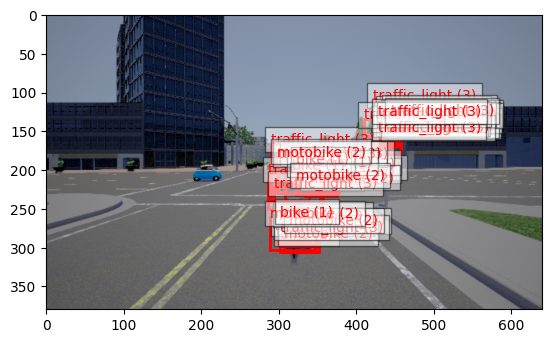

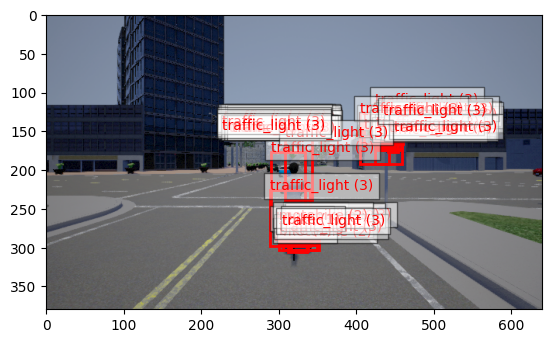

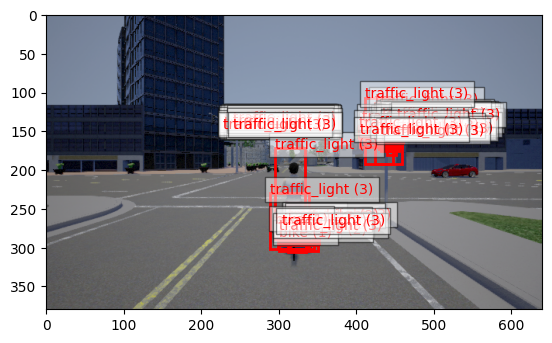

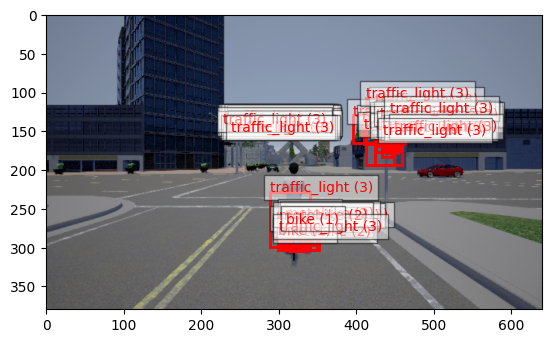

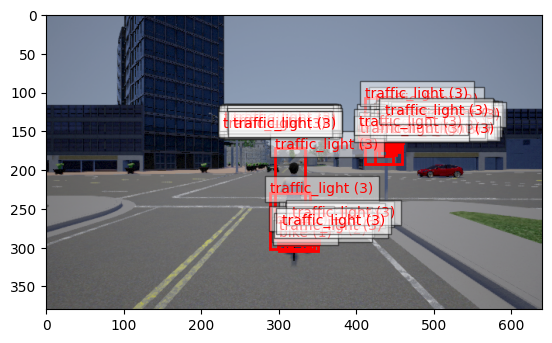

...

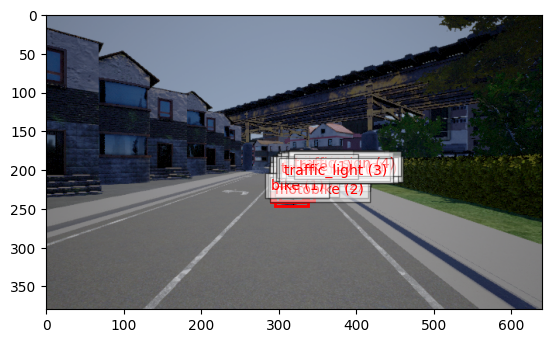

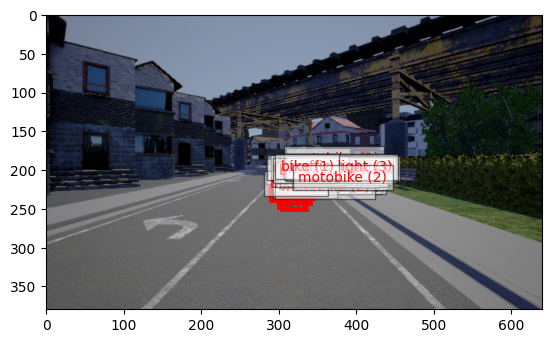

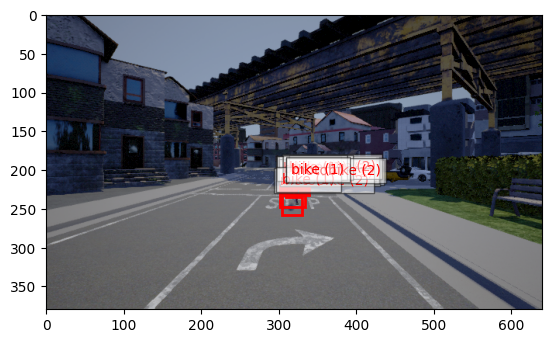

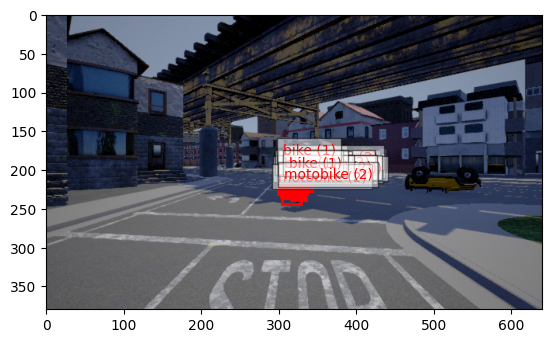

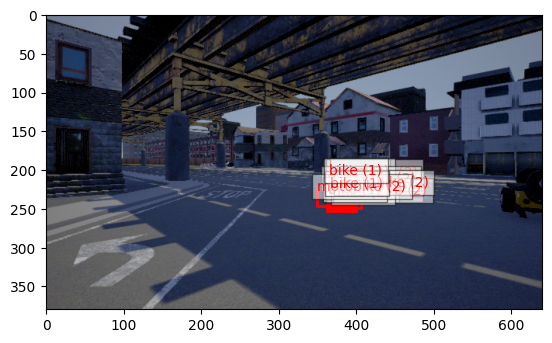

In [58]:
# Define a function to perform inference and display images with bounding boxes
def display_inferred_images(model, val_images_dir, transform, max_images=15):
    num_images_displayed = 0
    for filename in os.listdir(val_images_dir):
        if num_images_displayed >= max_images:
            break  # Exit loop if the maximum number of images has been displayed
        image_path = os.path.join(val_images_dir, filename)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply transformations
        input_image = transform(image)
        input_image = input_image.unsqueeze(0)  # Add batch dimension
        input_image = input_image.to(device)  # Move input image to GPU

        with torch.no_grad():
            predictions = model(input_image)  # Forward pass

        boxes = predictions[0]['boxes'].cpu().numpy()
        labels = predictions[0]['labels'].cpu().numpy()

        # Draw bounding boxes on the image
        draw_boxes(image, boxes, labels)
        
        num_images_displayed += 1  # Increment the count of displayed images

# Call the function to display inferred images (up to 15 images)
display_inferred_images(model, val_images_dir, transform, max_images=15)


## using saved weights on test set

### parsing test labels as they are .xml since they are our ground truth labels

In [45]:
# Define class map
class_map = {'vehicle': 0, 'bike': 1, 'motobike': 2, 'traffic_light': 3, 'traffic_sign': 4}

def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    boxes = []
    for obj in root.findall('object'):
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)
        label_name = obj.find('name').text
        label_id = class_map.get(label_name)
        if label_id is not None:
            boxes.append((xmin, ymin, xmax, ymax, label_id))

    return boxes


def extract_ground_truth_labels(test_labels_path, test_output_dir):
    if not os.path.exists(test_output_dir):
        os.makedirs(test_output_dir)

    for filename in os.listdir(test_labels_path):
        if filename.endswith('.xml'):
            image_id = os.path.splitext(filename)[0]
            xml_file = os.path.join(test_labels_path, filename)
            ground_truth_boxes = parse_xml(xml_file)
            test_output_file_path = os.path.join(test_output_dir, image_id + '.txt')
            with open(test_output_file_path, 'w') as test_output_file:
                for box in ground_truth_boxes:
                    xmin, ymin, xmax, ymax, label_id = box
                    test_output_file.write(f"{xmin} {ymin} {xmax} {ymax} {label_id}\n")

# Define the path to the validation labels directory
test_labels_path = "FasterRCNN-dataset/test/labels"

# Define the directory to store the extracted ground truth labels
test_output_dir = "test_ground_truth_labels-fasterrcnn-data"

# Extract ground truth labels for the validation set and save them in the output directory
extract_ground_truth_labels(test_labels_path, test_output_dir)

print("test Ground truth labels saved to:", test_output_dir)


test Ground truth labels saved to: test_ground_truth_labels-fasterrcnn-data


### Extracting predciting labels from test images by inferencing with saved weights so that we can compare thm to the ground truth labels

In [46]:
test_images_dir = "FasterRCNN-dataset/test/images"
test_output_dir = "test_ground_truth_labels-fasterrcnn-data"

In [47]:
saved_weights_path = "trained_weights.pth"
saved_weights = torch.load(saved_weights_path)

In [48]:
test_transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])

In [49]:
# Define the path to the validation labels directory
test_labels_path = "FasterRCNN-dataset/test/labels"

# Define the directory to store the extracted ground truth labels
test_output_dir = "test_ground_truth_labels-fasterrcnn-data"

# Extract ground truth labels for the validation set and save them in the output directory
extract_ground_truth_labels(test_labels_path, test_output_dir)

print("test Ground truth labels saved to:", test_output_dir)

# Load parsed labels from the saved output directory
test_parsed_labels = read_labels(test_output_dir)

# Create validation dataset
test_dataset = CustomDataset(test_images_dir, test_parsed_labels, class_map, max_objects_per_image, transforms=val_transforms)


test Ground truth labels saved to: test_ground_truth_labels-fasterrcnn-data


In [50]:
# Create test data loader
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [51]:
model.to(device)  
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [52]:
output_dir = "test_predcited_labels-fasterrcnn-data"  # Creating a new directory named "FasterRCNN-dataset" in the current directory
os.makedirs(output_dir, exist_ok=True)

# Define transforms for preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),  
])

# Iterate over the validation dataset
for filename in os.listdir(test_images_dir):
    image_path = os.path.join(test_images_dir, filename)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply transformations
    input_image = transform(image)
    input_image = input_image.unsqueeze(0)  # Add batch dimension
    input_image = input_image.to(device)  # Move input image to GPU
    
    with torch.no_grad():
        predictions = model(input_image)  # Forward pass
    
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    
    # Saving predicted bounding boxes and labels to a file
    output_file_path = os.path.join(output_dir, f"{os.path.splitext(filename)[0]}.txt")
    with open(output_file_path, 'w') as output_file:
        for box, label in zip(boxes, labels):
            output_file.write(f"{box[0]} {box[1]} {box[2]} {box[3]} {label}\n")

## Calculationg IOU and Accuracy of test data

In [53]:
# Define paths to predicted and ground truth label folders
test_predicted_labels_folder = "test_predcited_labels-fasterrcnn-data"
test_ground_truth_labels_folder = "test_ground_truth_labels-fasterrcnn-data"

In [54]:
total_iou = 0
num_comparisons = 0

# Iterate over predicted label files
for pred_file in os.listdir(test_predicted_labels_folder):
    if pred_file.endswith(".txt"):
        pred_file_path = os.path.join(test_predicted_labels_folder, pred_file)
        gt_file_path = os.path.join(test_ground_truth_labels_folder, pred_file)

        # Read predicted and ground truth bounding boxes from files
        with open(pred_file_path, 'r') as f:
            predicted_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]
        with open(gt_file_path, 'r') as f:
            ground_truth_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]

        # Calculate IOU for each predicted box with each ground truth box
        for pred_box in predicted_boxes:
            for gt_box in ground_truth_boxes:
                iou = calculate_iou(pred_box, gt_box)
                total_iou += iou
                num_comparisons += 1

# Calculate average IOU
average_iou = total_iou / num_comparisons
print("Average IOU of test data:", average_iou)

Average IOU of test data: 0.01399050009212724


In [55]:
# Define a function to calculate accuracy based on IOU threshold
def calculate_accuracy(predicted_boxes, ground_truth_boxes, iou_threshold):
    total_predictions = len(predicted_boxes)
    true_positives = 0
    
    for pred_box in predicted_boxes:
        for gt_box in ground_truth_boxes:
            iou = calculate_iou(pred_box, gt_box)
            if iou >= iou_threshold:
                true_positives += 1
                break  # Break once a true positive is found for the predicted box
    
    accuracy = true_positives / total_predictions if total_predictions > 0 else 0
    return accuracy

# Define a function to calculate accuracy for the entire dataset
def calculate_dataset_accuracy(predicted_labels_folder, ground_truth_labels_folder, iou_threshold):
    total_accuracy = 0
    num_files = 0

    # Iterate over predicted label files
    for pred_file in os.listdir(predicted_labels_folder):
        if pred_file.endswith(".txt"):
            pred_file_path = os.path.join(predicted_labels_folder, pred_file)
            gt_file_path = os.path.join(ground_truth_labels_folder, pred_file)

            # Read predicted and ground truth bounding boxes from files
            with open(pred_file_path, 'r') as f:
                predicted_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]
            with open(gt_file_path, 'r') as f:
                ground_truth_boxes = [list(map(float, line.strip().split())) for line in f.readlines()]

            # Calculate accuracy for each file
            accuracy = calculate_accuracy(predicted_boxes, ground_truth_boxes, iou_threshold)
            total_accuracy += accuracy
            num_files += 1

    # Calculate average accuracy
    average_accuracy = total_accuracy / num_files if num_files > 0 else 0
    return average_accuracy

# Define IOU threshold for calculating accuracy
iou_threshold = 0.5

# Calculate and print the accuracy
accuracy = calculate_dataset_accuracy(test_predicted_labels_folder, test_ground_truth_labels_folder, iou_threshold)
print("Accuracy:", accuracy)

Accuracy: 0.04054747923787725


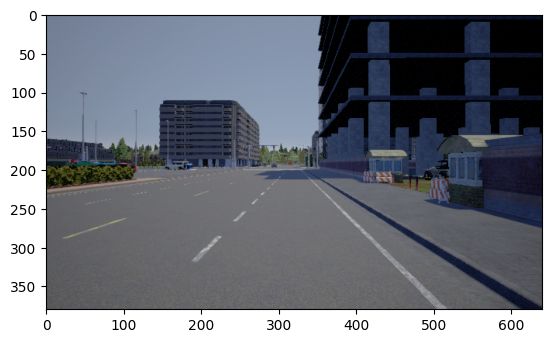

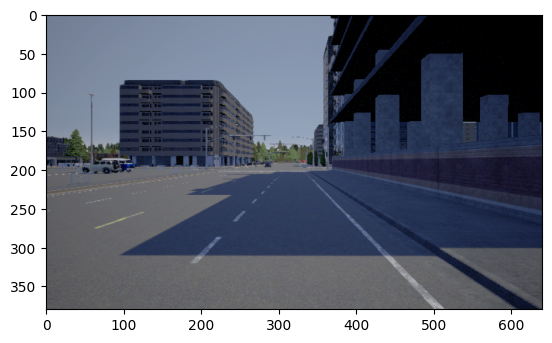

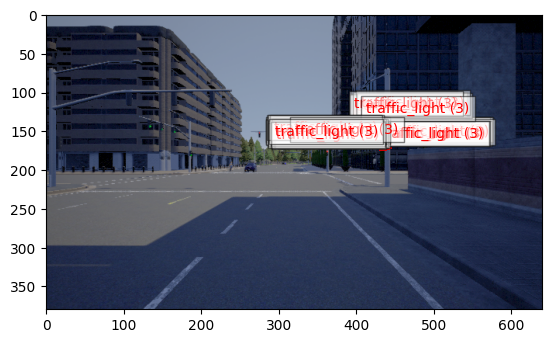

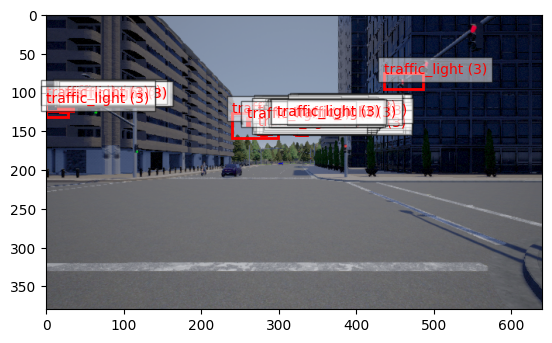

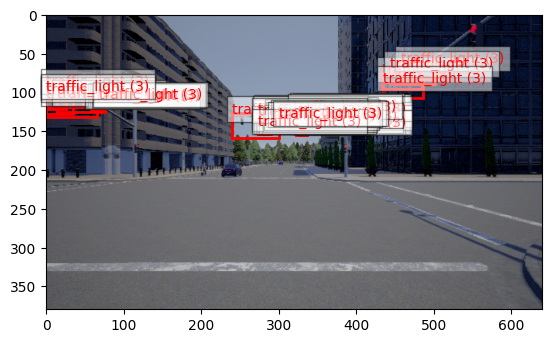

...

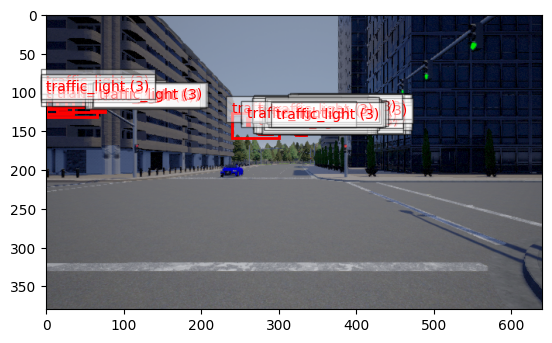

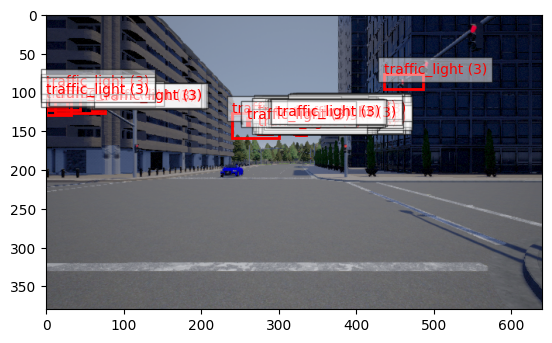

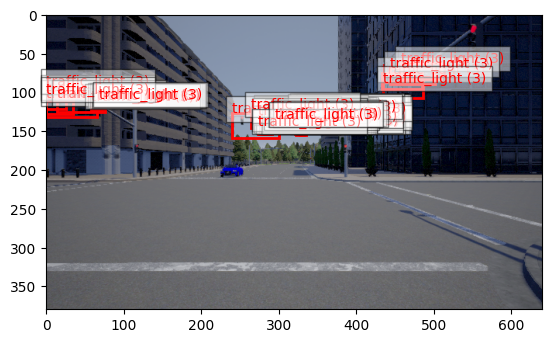

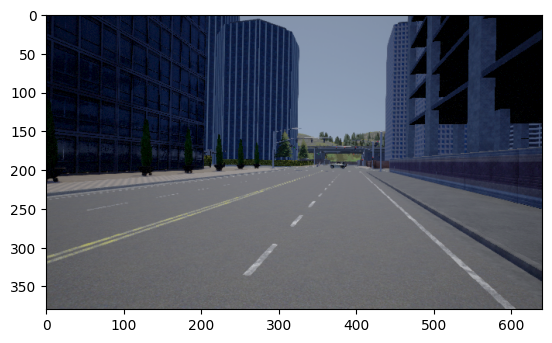

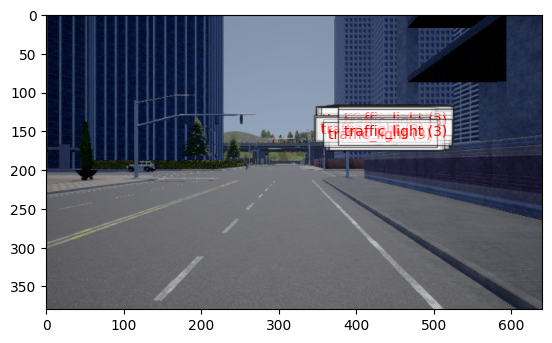

In [57]:
# Define a function to perform inference and display images with bounding boxes
def display_inferred_images(model, test_images_dir, transform, max_images=15):
    num_images_displayed = 0
    for filename in os.listdir(test_images_dir):
        if num_images_displayed >= max_images:
            break  # Exit loop if the maximum number of images has been displayed
        image_path = os.path.join(test_images_dir, filename)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply transformations
        input_image = transform(image)
        input_image = input_image.unsqueeze(0)  # Add batch dimension
        input_image = input_image.to(device)  # Move input image to GPU

        with torch.no_grad():
            predictions = model(input_image)  # Forward pass

        boxes = predictions[0]['boxes'].cpu().numpy()
        labels = predictions[0]['labels'].cpu().numpy()

        # Draw bounding boxes on the image
        draw_boxes(image, boxes, labels)
        
        num_images_displayed += 1  # Increment the count of displayed images

# Call the function to display inferred images (up to 15 images)
display_inferred_images(model, test_images_dir, transform, max_images=15)
